In [4]:
import tensorflow as tf

In [7]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import os
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn.functional as F

random_seed = 42
torch.manual_seed(random_seed)

BATCH_SIZE=128
AVAIL_GPUS = min(1, torch.cuda.device_count())
NUM_WORKERS=int(os.cpu_count() / 2)

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
directory ='/content/drive/MyDrive/Images'
print(len(os.listdir(directory )))

1


In [11]:
directory ='/content/drive/MyDrive/Images'

In [13]:
image_size=64
batch_size=128
stats=((0.5,0.5,0.5),(0.5,0.5,0.5))

In [14]:
from torchvision.datasets import DatasetFolder
import torchvision.transforms as T
from PIL import Image
import os
c_name = 'my_class'
c_dir = os.path.join(directory, c_name)
os.makedirs(c_dir, exist_ok=True)

for filename in os.listdir(directory):
    if filename.endswith('.jpg'):
        src_path = os.path.join(directory, filename)
        dst_path = os.path.join(c_dir, filename)
        os.rename(src_path, dst_path)

trained_ds = DatasetFolder(directory,
                         loader=lambda x: Image.open(x),
                         extensions=['jpg'],
                         transform= T.Compose([
                             T.Resize(image_size),
                             T.CenterCrop(image_size),
                             T.ToTensor(),
                             T.Normalize(*stats)
                         ])
                        )
trained_dl = DataLoader(trained_ds, batch_size , shuffle=True,num_workers=3,pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [15]:
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1).to(device)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1).to(device)
    return images * stds + means

def show_batch(dl):
        fig, ax = plt.subplots(figsize=(12, 12))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(dl, *stats)
        ax.imshow(make_grid(denorm_images[:32], nrow=8).permute(1,2,0))

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


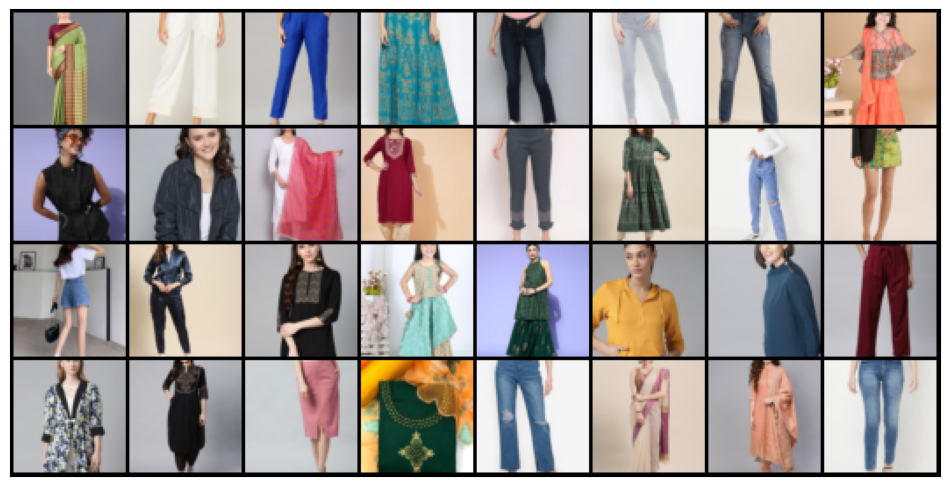

In [17]:

show_batch(trained_dl)


In [18]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device


    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)
    def __len__(self):
      return len(self.dl)

In [19]:
device = get_default_device()
device

device(type='cpu')

In [20]:
train_dl=DeviceDataLoader(trained_dl,device)

In [22]:
import torch.nn as nn
discriminator = nn.Sequential(

  nn.Conv2d(3,64,kernel_size=4, stride = 2, padding=1, bias=False),
  nn.BatchNorm2d(64),
  nn.LeakyReLU(0.2,inplace=True),

  nn.Conv2d(64,128,kernel_size=4, stride = 2, padding=1, bias=False),
  nn.BatchNorm2d(128),
  nn.LeakyReLU(0.2,inplace=True),

  nn.Conv2d(128,256,kernel_size=4, stride = 2, padding=1, bias=False),
  nn.BatchNorm2d(256),
  nn.LeakyReLU(0.2,inplace=True),

  nn.Conv2d(256,512,kernel_size=4, stride = 2, padding=1, bias=False),
  nn.BatchNorm2d(512),
  nn.LeakyReLU(0.2,inplace=True),

  nn.Conv2d(512,1,kernel_size=4, stride = 1, padding=0, bias=False),
  nn.Flatten(),
  nn.Sigmoid()

)

In [ ]:
model = to_device(discriminator, device)

In [25]:
latent_size=128

In [26]:
generator=nn.Sequential(
          nn.ConvTranspose2d(latent_size, 512, kernel_size=4,stride =1, padding=0,bias=False),
          nn.BatchNorm2d(512),
          nn.ReLU(True),

          nn.ConvTranspose2d(512,256, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(256),
          nn.ReLU(True),

          nn.ConvTranspose2d(256,128, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(128),
          nn.ReLU(True),

          nn.ConvTranspose2d(128,64, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(64),
          nn.ReLU(True),

          nn.ConvTranspose2d(64,3, kernel_size=4,stride =2, padding=1,bias=False),
          nn.Tanh()
)

In [27]:
generator=to_device(generator,device)

In [29]:
xb=torch.randn(2,latent_size,1,1,device=device)

In [ ]:
fake_img = generator(xb)

In [32]:
def tr_discrim(real_images,opt_d):
  opt_d.zero_grad()
  real_preds = discriminator (real_images)
  real_targets = torch.ones (real_images. size (0) , 1, device=device )
  real_loss = F.binary_cross_entropy (real_preds, real_targets)
  real_score = torch.mean(real_preds). item ()
  latent =  torch.randn (batch_size, latent_size, 1, 1, device=device )
  fake_images = generator( latent)
  fake_targets= torch.zeros(fake_images. size (0), 1, device=device)
  fake_preds = discriminator(fake_images)
  fake_loss = F.binary_cross_entropy ( fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()

  loss = real_loss+fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(), real_score, fake_score

In [33]:
def tr_generator(opt_g):
  opt_g.zero_grad()
  latent = torch.randn(batch_size, latent_size, 1,1 , device=device)
  fake_imgs =  generator(latent)

  fool_discrim_preds = discriminator(fake_imgs)
  fool_discrim_target = torch.ones(batch_size,1, device=device)
  loss = F.binary_cross_entropy(fool_discrim_preds,fool_discrim_target)

  loss.backward()
  opt_g.step()
  return loss.item()


In [34]:
from torchvision.utils import save_image

In [35]:
sample_dir = 'generated'
os.makedirs(sample_dir,exist_ok=True)

In [36]:
def save_generated(index,latent_tensors,show=True):
  fake_imgs = generator(latent_tensors)
  fake_label = 'img_generated-{0:0=4d}.png'.format(index)
  save_image(denormalize(fake_imgs,*stats),os.path.join(sample_dir,fake_label),nrow=8)
  if show:
    fig,ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_imgs.cpu().detach(),nrow=8).permute(1,2,0))


In [37]:
fake_imgs = generator(xb)

In [38]:
fake_label = 'img_generated-{0:0=4d}.png'.format(1)

In [39]:
save_image(denormalize(fake_imgs,*stats),os.path.join(sample_dir,fake_label),nrow=8)

In [40]:
xr = torch.randn(64, latent_size, 1,1,device=device)

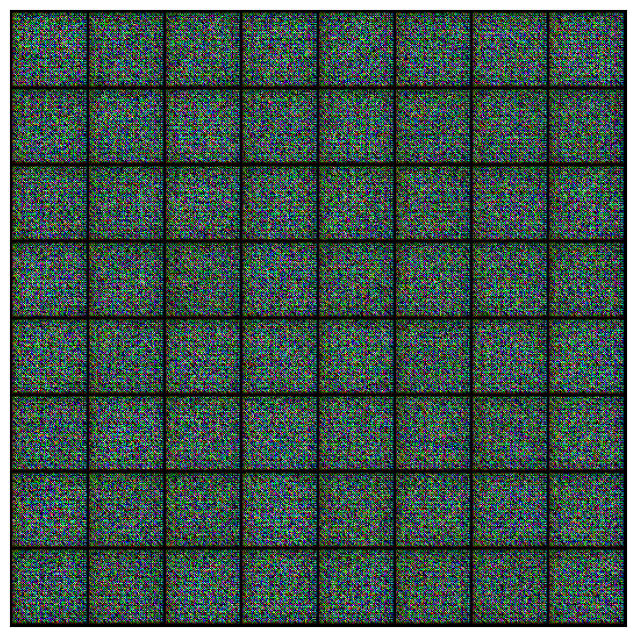

In [41]:
save_generated(0,xr)

In [42]:
from tqdm.notebook import tqdm
import torch.nn.functional as F
import time

In [43]:
def fit(epochs, lr, start_idx=1):
   torch.cuda.empty_cache()

   losses_g = []
   losses_d = []
   real_scores = []
   fake_scores = []

   opt_d = torch.optim.Adam(discriminator.parameters(),lr=lr, betas = (0.5, 0.999))
   opt_g = torch.optim.Adam(generator.parameters(),lr=lr , betas = (0.5,0.999))
   t1=time.time()
   for epoch in range(epochs):
     for real_images, _ in tqdm(train_dl):
       loss_d , real_score, fake_score = tr_discrim(real_images, opt_d)
       loss_g = tr_generator(opt_g)

     losses_g.append(loss_g)
     losses_d.append(loss_d)
     real_scores.append(real_score)
     fake_scores.append(fake_score)

     print("Epoch[{}/{}], loss_g:{:.4f}, loss_d:{:.4f},real_score:{:.4f}, fake_score:{:.4f} ".format(epoch+1,epochs,loss_g,loss_d,real_score,fake_score))

     save_generated(epoch+start_idx,xr,show=False)
   t2=time.time()
   print("time taken",t2-t1)
   return losses_g,  real_scores, fake_scores ,losses_d,

In [44]:
lr = 0.0002
epochs = 100
metric_values = fit(epochs, lr)
metric_values_100 = metric_values

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[1/100], loss_g:3.1088, loss_d:1.2045,real_score:0.8280, fake_score:0.6224 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[2/100], loss_g:3.9882, loss_d:0.7018,real_score:0.7372, fake_score:0.2827 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[3/100], loss_g:5.2327, loss_d:0.4825,real_score:0.8301, fake_score:0.1943 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[4/100], loss_g:6.4054, loss_d:0.3083,real_score:0.9064, fake_score:0.1768 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[5/100], loss_g:6.7764, loss_d:0.3286,real_score:0.8590, fake_score:0.1453 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[6/100], loss_g:8.5426, loss_d:0.2418,real_score:0.9459, fake_score:0.1627 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[7/100], loss_g:9.1437, loss_d:0.2673,real_score:0.9437, fake_score:0.1843 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[8/100], loss_g:8.3417, loss_d:0.2451,real_score:0.9050, fake_score:0.1229 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[9/100], loss_g:10.0010, loss_d:0.1783,real_score:0.9633, fake_score:0.1279 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[10/100], loss_g:7.7476, loss_d:0.0761,real_score:0.9803, fake_score:0.0541 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[11/100], loss_g:10.3203, loss_d:0.0502,real_score:0.9534, fake_score:0.0010 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[12/100], loss_g:14.9599, loss_d:0.4102,real_score:0.9708, fake_score:0.3101 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[13/100], loss_g:15.1013, loss_d:0.1119,real_score:0.9030, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[14/100], loss_g:8.3039, loss_d:0.0158,real_score:0.9850, fake_score:0.0003 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[15/100], loss_g:15.2015, loss_d:0.0345,real_score:0.9677, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[16/100], loss_g:11.4845, loss_d:0.0176,real_score:0.9828, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[17/100], loss_g:17.6074, loss_d:1.0485,real_score:0.9901, fake_score:0.6352 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[18/100], loss_g:18.5287, loss_d:0.0820,real_score:0.9255, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[19/100], loss_g:16.7312, loss_d:0.0195,real_score:0.9816, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[20/100], loss_g:12.9507, loss_d:0.0097,real_score:0.9905, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[21/100], loss_g:8.5708, loss_d:0.0716,real_score:0.9978, fake_score:0.0667 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[22/100], loss_g:13.6389, loss_d:0.0081,real_score:0.9921, fake_score:0.0001 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[23/100], loss_g:6.5568, loss_d:0.0154,real_score:0.9920, fake_score:0.0073 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[24/100], loss_g:20.2368, loss_d:0.9414,real_score:0.5300, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[25/100], loss_g:19.0116, loss_d:0.0543,real_score:0.9524, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[26/100], loss_g:17.1178, loss_d:0.0074,real_score:0.9932, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[27/100], loss_g:13.8032, loss_d:0.0036,real_score:0.9965, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[28/100], loss_g:5.4218, loss_d:0.0226,real_score:0.9959, fake_score:0.0182 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[29/100], loss_g:18.2932, loss_d:0.0295,real_score:0.9721, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[30/100], loss_g:17.6050, loss_d:0.0674,real_score:0.9398, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[31/100], loss_g:16.0941, loss_d:0.0176,real_score:0.9831, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[32/100], loss_g:14.0738, loss_d:0.0107,real_score:0.9895, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[33/100], loss_g:10.6500, loss_d:0.0075,real_score:0.9926, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[34/100], loss_g:13.0751, loss_d:0.4117,real_score:0.9738, fake_score:0.3122 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[35/100], loss_g:12.6951, loss_d:0.0502,real_score:0.9543, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[36/100], loss_g:5.7786, loss_d:0.0274,real_score:0.9815, fake_score:0.0084 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[37/100], loss_g:18.6674, loss_d:1.1815,real_score:0.4288, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[38/100], loss_g:16.9184, loss_d:0.0792,real_score:0.9401, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[39/100], loss_g:13.9132, loss_d:0.0142,real_score:0.9864, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[40/100], loss_g:7.4461, loss_d:0.0260,real_score:0.9782, fake_score:0.0010 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[41/100], loss_g:9.1900, loss_d:0.1560,real_score:0.9886, fake_score:0.1330 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[42/100], loss_g:13.6626, loss_d:0.4029,real_score:0.9838, fake_score:0.3157 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[43/100], loss_g:12.0296, loss_d:0.5238,real_score:0.6663, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[44/100], loss_g:5.2576, loss_d:0.0660,real_score:0.9823, fake_score:0.0456 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[45/100], loss_g:18.4446, loss_d:0.5831,real_score:0.6285, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[46/100], loss_g:15.8266, loss_d:0.0404,real_score:0.9628, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[47/100], loss_g:12.3254, loss_d:0.0140,real_score:0.9866, fake_score:0.0000 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[48/100], loss_g:7.4735, loss_d:0.0188,real_score:0.9861, fake_score:0.0046 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[49/100], loss_g:9.6902, loss_d:0.5147,real_score:0.9842, fake_score:0.3538 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[50/100], loss_g:8.7063, loss_d:0.0669,real_score:0.9408, fake_score:0.0015 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[51/100], loss_g:11.6494, loss_d:0.6546,real_score:0.9388, fake_score:0.3962 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[52/100], loss_g:8.9085, loss_d:0.5261,real_score:0.6458, fake_score:0.0004 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[53/100], loss_g:4.9151, loss_d:0.1429,real_score:0.9700, fake_score:0.1017 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[54/100], loss_g:11.9444, loss_d:0.1469,real_score:0.8753, fake_score:0.0002 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[55/100], loss_g:9.8749, loss_d:0.0569,real_score:0.9477, fake_score:0.0002 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[56/100], loss_g:7.2077, loss_d:0.0377,real_score:0.9662, fake_score:0.0022 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[57/100], loss_g:5.7120, loss_d:0.1955,real_score:0.9921, fake_score:0.1617 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[58/100], loss_g:7.0154, loss_d:0.0843,real_score:0.9338, fake_score:0.0130 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[59/100], loss_g:6.2181, loss_d:0.2340,real_score:0.8904, fake_score:0.1007 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[60/100], loss_g:7.1392, loss_d:0.1638,real_score:0.9263, fake_score:0.0792 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[61/100], loss_g:13.2711, loss_d:0.4912,real_score:0.9251, fake_score:0.3176 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[62/100], loss_g:9.2740, loss_d:3.5374,real_score:0.9611, fake_score:0.9627 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[63/100], loss_g:2.4060, loss_d:1.3089,real_score:0.4060, fake_score:0.0318 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[64/100], loss_g:3.9842, loss_d:0.6005,real_score:0.9250, fake_score:0.3796 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[65/100], loss_g:3.4398, loss_d:0.4056,real_score:0.7716, fake_score:0.0657 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[66/100], loss_g:3.6984, loss_d:0.5033,real_score:0.8237, fake_score:0.2265 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[67/100], loss_g:3.7917, loss_d:0.3098,real_score:0.8430, fake_score:0.1151 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[68/100], loss_g:4.0835, loss_d:0.4151,real_score:0.8029, fake_score:0.1566 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[69/100], loss_g:5.9252, loss_d:0.4732,real_score:0.8704, fake_score:0.2719 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[70/100], loss_g:7.2668, loss_d:1.3894,real_score:0.9383, fake_score:0.7209 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[71/100], loss_g:2.2292, loss_d:0.3515,real_score:0.8031, fake_score:0.1023 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[72/100], loss_g:4.5018, loss_d:0.1557,real_score:0.9201, fake_score:0.0655 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[73/100], loss_g:3.9612, loss_d:0.2504,real_score:0.9321, fake_score:0.1600 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[74/100], loss_g:3.4296, loss_d:0.3293,real_score:0.8117, fake_score:0.1027 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[75/100], loss_g:1.9642, loss_d:0.4728,real_score:0.6977, fake_score:0.0489 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[76/100], loss_g:3.6032, loss_d:1.8247,real_score:0.2545, fake_score:0.0021 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[77/100], loss_g:5.6073, loss_d:0.5227,real_score:0.9825, fake_score:0.3844 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[78/100], loss_g:4.7115, loss_d:0.0825,real_score:0.9449, fake_score:0.0236 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[79/100], loss_g:4.9057, loss_d:0.3312,real_score:0.9037, fake_score:0.1968 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[80/100], loss_g:3.9161, loss_d:0.3681,real_score:0.8540, fake_score:0.1666 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[81/100], loss_g:2.8627, loss_d:0.4003,real_score:0.7534, fake_score:0.0832 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[82/100], loss_g:2.1708, loss_d:0.8041,real_score:0.5332, fake_score:0.0170 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[83/100], loss_g:5.6384, loss_d:0.5231,real_score:0.7544, fake_score:0.1008 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[84/100], loss_g:4.6334, loss_d:0.3012,real_score:0.8835, fake_score:0.1449 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[85/100], loss_g:3.5329, loss_d:0.2648,real_score:0.8458, fake_score:0.0805 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[86/100], loss_g:3.4897, loss_d:0.2834,real_score:0.8278, fake_score:0.0786 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[87/100], loss_g:2.7867, loss_d:0.4531,real_score:0.7161, fake_score:0.0714 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[88/100], loss_g:5.4857, loss_d:0.6954,real_score:0.5365, fake_score:0.0045 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[89/100], loss_g:5.8304, loss_d:0.4711,real_score:0.9704, fake_score:0.3483 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[90/100], loss_g:3.5333, loss_d:0.2472,real_score:0.8415, fake_score:0.0506 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[91/100], loss_g:3.7473, loss_d:0.3609,real_score:0.7825, fake_score:0.0907 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[92/100], loss_g:3.3986, loss_d:0.3011,real_score:0.8168, fake_score:0.0840 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[93/100], loss_g:2.6797, loss_d:0.4828,real_score:0.6743, fake_score:0.0404 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[94/100], loss_g:3.6166, loss_d:0.6859,real_score:0.5841, fake_score:0.0220 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[95/100], loss_g:5.8614, loss_d:0.3491,real_score:0.9344, fake_score:0.2219 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[96/100], loss_g:3.0431, loss_d:0.2786,real_score:0.9168, fake_score:0.1618 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[97/100], loss_g:4.2431, loss_d:0.2472,real_score:0.8806, fake_score:0.1034 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[98/100], loss_g:4.5795, loss_d:0.2636,real_score:0.9236, fake_score:0.1577 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[99/100], loss_g:4.9971, loss_d:0.3135,real_score:0.9159, fake_score:0.1821 


  0%|          | 0/2 [00:00<?, ?it/s]

Epoch[100/100], loss_g:7.7870, loss_d:0.5914,real_score:0.9446, fake_score:0.3835 
time taken 2973.9946551322937


In [46]:
metric_values = list(metric_values_100)

In [ ]:
from google.colab import files
files.download('/content/generated')

In [48]:
!zip -r /content/generated.zip /content/generated

  adding: content/generated/ (stored 0%)
  adding: content/generated/img_generated-0011.png (deflated 0%)
  adding: content/generated/img_generated-0041.png (deflated 0%)
  adding: content/generated/img_generated-0097.png (deflated 0%)
  adding: content/generated/img_generated-0038.png (deflated 0%)
  adding: content/generated/img_generated-0077.png (deflated 0%)
  adding: content/generated/img_generated-0002.png (deflated 0%)
  adding: content/generated/img_generated-0060.png (deflated 0%)
  adding: content/generated/img_generated-0063.png (deflated 0%)
  adding: content/generated/img_generated-0088.png (deflated 0%)
  adding: content/generated/img_generated-0006.png (deflated 0%)
  adding: content/generated/img_generated-0098.png (deflated 0%)
  adding: content/generated/img_generated-0052.png (deflated 0%)
  adding: content/generated/img_generated-0082.png (deflated 0%)
  adding: content/generated/img_generated-0053.png (deflated 0%)
  adding: content/generated/img_generated-0100.pn

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


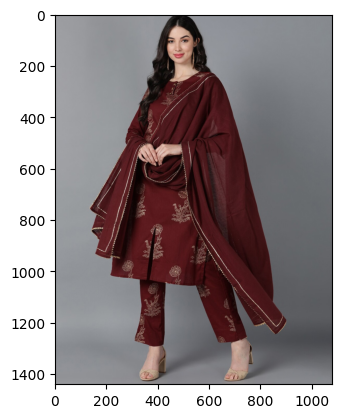

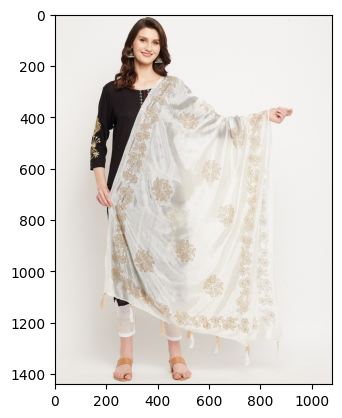

In [53]:
import torchvision.transforms as T
import os
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

img_size = 256
DATA_DIR='/content/images/my_class'

images = []
if os.path.exists(DATA_DIR):
  images = os.listdir(DATA_DIR)
else:
  print("Error: Directory not found.")

def open_image(p):
    with open(p,'rb') as file:
        img=Image.open(file)
        return img.convert('RGB')

if images:
  plt.imshow(open_image(os.path.join(DATA_DIR,images[10])))
  plt.show()
  plt.imshow(Image.open(os.path.join(DATA_DIR,images[5])))
  plt.show()
else:
  print("No images found in the directory.")

In [54]:
from torch.utils.data import Dataset
class preprocess(Dataset):
    def __init__(self,root,transform):
        super().__init__()
        self.root=root
        self.files = [f for f in os.listdir(root)]
        self.transform = transform
    def __len__(self):
        return len(self.files)
    def __getitem__(self,i):
        f=self.files[i]
        fp=os.path.join(self.root,f)
        img=self.transform(open_image(fp))
        return img

In [55]:
imagenet_stats =([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
img_size = 256
dataset = preprocess(DATA_DIR,T.Compose ([
T.Resize (img_size),
T.Pad (8, padding_mode='reflect'),
T.CenterCrop(img_size),
T.ToTensor(),
T.Normalize(*imagenet_stats)]))

In [56]:
def device_available():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.cuda.device('cpu')
def feed_device(data,device):
    if isinstance(data, (list,tuple)):
        return [feed_device(x, device) for x in data]
    return data.to(device,non_blocking = True)
class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield feed_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [ ]:
device = device_available()

In [58]:
def denormalize(images, means, stds):
    means = torch.tensor(means).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)
    return images * stds + means
def denormalize_gpu(images, means, stds):
    means = torch.tensor(means,device=device).reshape(1, 3, 1, 1)
    stds = torch.tensor(stds,device=device).reshape(1, 3, 1, 1)
    return images * stds + means
def show_image(dl):
    if len(dl.shape)==3:
        dl = dl.unsqueeze(0)
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.set_xticks([]); ax.set_yticks([])
    denorm_images = denormalize(dl, *imagenet_stats)
    ax.imshow(make_grid(denorm_images[:64], nrow=8).permute(1,2,0))

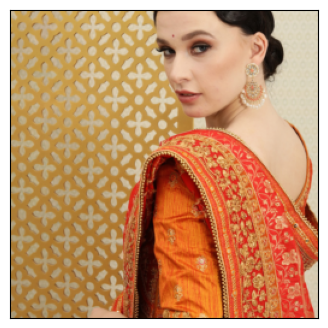

In [59]:
show_image(dataset[0])

In [60]:
from torch.utils.data import random_split
val_pct = 0.3
val_size = int(val_pct* len (dataset))
train_ds,valid_ds = random_split ( dataset,[len(dataset) - val_size, val_size ])

In [61]:

batch_size = 128
train_dl = DataLoader ( train_ds, batch_size, shuffle=True , num_workers=3 , pin_memory=True)
valid_dl= DataLoader (valid_ds , batch_size*2 , num_workers=4, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [62]:
def show_batch(dl):
    for images in dl:
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.set_xticks([]); ax.set_yticks([])
        denorm_images = denormalize(images, *imagenet_stats)
        ax.imshow(make_grid(denorm_images[:64], nrow=8).permute(1,2,0))
        break


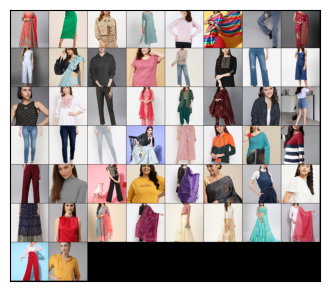

In [63]:
show_batch(valid_dl)

In [64]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [65]:
train_dl = DeviceDataLoader(train_dl, device)
valid_dl = DeviceDataLoader(valid_dl, device)

In [66]:
import torch.nn as nn
import torch. nn. functional as F
def accuracy (outputs, labels) :
    preds = torch.max (outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len (preds ) )

class ImageClassificationBase (nn. Module ) :
    def training_step (self, batch) :
        images, labels = batch
        out=self(images)
        loss= F.cross_entropy (out, labels)
        return loss
    def validate_stop(self, batch):
        valid , _ =batch
        out= self (valid)
        loss = F.cross_entropy (out, _)
        acc = accuracy (out, labels)
        return {'val_loss': loss .detach (), 'val_acc' : acc}


In [67]:
from torchvision import models
class discriminator(nn.Module):
    def __init__(self,pretrained=True):
        super().__init__()
        self.network = models.resnet34(pretrained=pretrained)
        self.network.fc = nn.Linear(self.network.fc.in_features,1)
    def forward(self,xb):
        return self.network(xb)

In [68]:
resnet=models.resnet34(pretrained=True)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 104MB/s]


In [69]:

discriminator = models.resnet34(pretrained=True)
discriminator.fc = nn.Linear(discriminator.fc.in_features,1)

In [70]:

discriminator = feed_device(discriminator, device)

In [71]:

generator=nn.Sequential(
          nn.ConvTranspose2d(latent_size, 512, kernel_size=4,stride =1, padding=0,bias=False),
          nn.BatchNorm2d(512),
          nn.ReLU(True),

          nn.ConvTranspose2d(512,256, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(256),
          nn.ReLU(True),

          nn.ConvTranspose2d(256,128, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(128),
          nn.ReLU(True),

          nn.ConvTranspose2d(128,64, kernel_size=4,stride =2, padding=1,bias=False),
          nn.BatchNorm2d(64),
          nn.ReLU(True),

          nn.ConvTranspose2d(64,3, kernel_size=4,stride =2, padding=1,bias=False),
          nn.Tanh()
)

In [72]:
generator = to_device(generator, device)

In [73]:
import numpy as np
def tr_discrim(real_images,opt_d):
    opt_d.zero_grad()

    real_preds = discriminator (real_images).cpu().detach().numpy()
    real_preds=(real_preds - np.min(real_preds)) / (np.max(real_preds) - np.min(real_preds))
    real_preds=torch.from_numpy(real_preds).to(device)
    real_preds.requires_grad =True
    real_targets = torch.ones (real_images. size (0) , 1,device=device)
    real_loss = F.binary_cross_entropy (real_preds, real_targets)
    real_score = torch.mean(real_preds). item ()
    latent =  torch.randn (batch_size, latent_size, 1, 1,device=device)
    fake_images = generator( latent)
    fake_targets= torch.zeros(fake_images. size (0), 1,device=device)
    fake_preds = discriminator(fake_images).cpu().detach().numpy()
    fake_preds=(fake_preds - np.min(fake_preds)) / (np.max(fake_preds) - np.min(fake_preds))
    fake_preds=torch.from_numpy(fake_preds).to(device)
    fake_loss = F.binary_cross_entropy ( fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    loss = real_loss+fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [74]:
def tr_generator(opt_g):
    opt_g.zero_grad()
    latent = torch.randn(batch_size, latent_size, 1,1,device=device )
    fake_imgs =  generator(latent)

    fool_discrim_preds = discriminator(fake_imgs).cpu().detach().numpy()
    fool_discrim_preds=(fool_discrim_preds - np.min(fool_discrim_preds)) / (np.max(fool_discrim_preds) - np.min(fool_discrim_preds))
    fool_discrim_preds=torch.from_numpy(fool_discrim_preds).to(device)
    fool_discrim_preds.requires_grad=True
    fool_discrim_target = torch.ones(batch_size,1,device=device)
    loss = F.binary_cross_entropy(fool_discrim_preds,fool_discrim_target)

    loss.backward()
    opt_g.step()
    return loss.item()

In [75]:
sample_dir = 'generated_65_resnet'
os.makedirs(sample_dir,exist_ok=True)

In [76]:
def save_generated(index,latent_tensors,show=True):
    fake_imgs = generator(latent_tensors)
    fake_label = 'img_generated-{0:0=4d}.png'.format(index)
    save_image(denormalize_gpu(fake_imgs,*imagenet_stats),os.path.join(sample_dir,fake_label),nrow=8)
    if show:
        fig,ax = plt.subplots(figsize=(8,8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_imgs.cpu().detach(),nrow=8).permute(1,2,0))

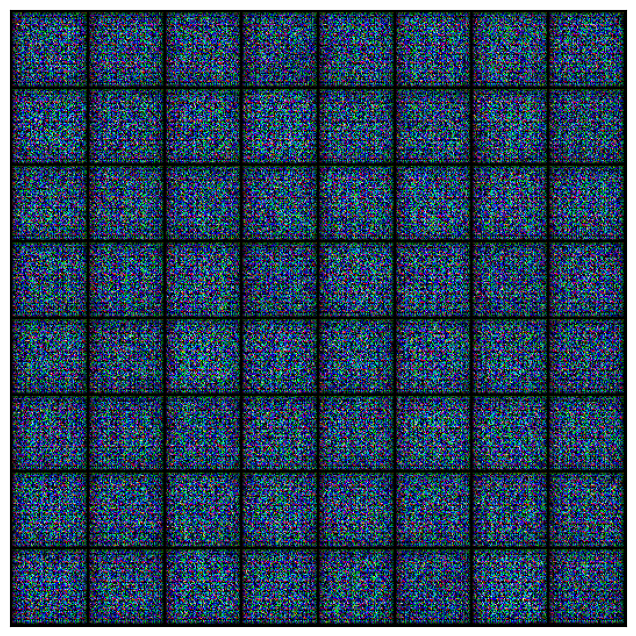

In [77]:
xr = torch.randn(64, latent_size, 1,1,device=device)

save_generated(0,xr)

In [78]:
def evaluate(model,valid_loader):
    model.eval()
    outputs = [validation_step(model,batch) for batch in valid_loader]
    return validation_epoch_end(outputs)
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    opt_d = torch.optim.Adam(discriminator.parameters(),lr=lr, betas = (0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(),lr=lr , betas = (0.5,0.999))

    for epoch in range(epochs):
        discriminator.train()
        generator.train()
        train_losses=[]
        for real_images in tqdm(train_dl):
            loss_d , real_score, fake_score = tr_discrim(real_images, opt_d)
            loss_g = tr_generator(opt_g)

        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        print("Epoch[{}/{}], loss_g:{:.4f}, loss_d:{:.4f},real_score:{:.4f}, fake_score:{:.4f} ".format(epoch+1,epochs,loss_g,loss_d,real_score,fake_score))

        save_generated(epoch+start_idx,xr,show=False)
    return losses_g, losses_d, real_score, fake_score

In [79]:
lr = 0.0002
epochs = 100

In [80]:
training = fit(epochs, lr)

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[1/100], loss_g:1.6015, loss_d:3.2296,real_score:0.3981, fake_score:0.4077 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[2/100], loss_g:1.5934, loss_d:3.3187,real_score:0.3981, fake_score:0.4584 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[3/100], loss_g:2.4918, loss_d:3.1803,real_score:0.3981, fake_score:0.3786 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[4/100], loss_g:1.5019, loss_d:3.4611,real_score:0.3981, fake_score:0.5089 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[5/100], loss_g:1.4856, loss_d:3.4134,real_score:0.3981, fake_score:0.5045 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[6/100], loss_g:1.6756, loss_d:3.3799,real_score:0.3981, fake_score:0.4885 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[7/100], loss_g:2.0984, loss_d:3.5404,real_score:0.3981, fake_score:0.5535 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[8/100], loss_g:1.7513, loss_d:3.1270,real_score:0.3981, fake_score:0.3587 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[9/100], loss_g:1.7328, loss_d:3.2658,real_score:0.3981, fake_score:0.4299 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[10/100], loss_g:1.9860, loss_d:3.6009,real_score:0.3981, fake_score:0.5745 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[11/100], loss_g:1.5573, loss_d:3.4246,real_score:0.3981, fake_score:0.5056 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[12/100], loss_g:2.0292, loss_d:3.4473,real_score:0.3981, fake_score:0.5207 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[13/100], loss_g:2.0006, loss_d:3.2283,real_score:0.3981, fake_score:0.4070 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[14/100], loss_g:1.5647, loss_d:3.3030,real_score:0.3981, fake_score:0.4621 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[15/100], loss_g:1.8250, loss_d:3.6693,real_score:0.3981, fake_score:0.5855 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[16/100], loss_g:1.4732, loss_d:3.5770,real_score:0.3981, fake_score:0.5280 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[17/100], loss_g:1.5114, loss_d:3.5192,real_score:0.3981, fake_score:0.5325 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[18/100], loss_g:2.0373, loss_d:3.1379,real_score:0.3981, fake_score:0.3624 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[19/100], loss_g:1.7395, loss_d:3.5942,real_score:0.3981, fake_score:0.5690 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[20/100], loss_g:1.6128, loss_d:3.2240,real_score:0.3981, fake_score:0.4170 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[21/100], loss_g:1.6014, loss_d:3.4413,real_score:0.3981, fake_score:0.5091 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[22/100], loss_g:1.5085, loss_d:3.3046,real_score:0.3981, fake_score:0.4510 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[23/100], loss_g:1.8350, loss_d:3.2873,real_score:0.3981, fake_score:0.4380 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[24/100], loss_g:1.9465, loss_d:3.0975,real_score:0.3981, fake_score:0.3459 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[25/100], loss_g:2.1374, loss_d:3.5408,real_score:0.3981, fake_score:0.5672 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[26/100], loss_g:1.9006, loss_d:3.3258,real_score:0.3981, fake_score:0.4533 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[27/100], loss_g:1.8719, loss_d:3.3128,real_score:0.3981, fake_score:0.4517 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[28/100], loss_g:1.6876, loss_d:3.4570,real_score:0.3981, fake_score:0.5105 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[29/100], loss_g:1.7989, loss_d:3.0936,real_score:0.3981, fake_score:0.3351 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[30/100], loss_g:1.7700, loss_d:3.2776,real_score:0.3981, fake_score:0.4418 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[31/100], loss_g:1.5458, loss_d:3.1653,real_score:0.3981, fake_score:0.3829 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[32/100], loss_g:1.9739, loss_d:3.2436,real_score:0.3981, fake_score:0.4199 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[33/100], loss_g:1.6737, loss_d:3.2902,real_score:0.3981, fake_score:0.4497 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[34/100], loss_g:1.8260, loss_d:2.9738,real_score:0.3981, fake_score:0.2666 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[35/100], loss_g:1.5999, loss_d:3.1869,real_score:0.3981, fake_score:0.3951 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[36/100], loss_g:1.7769, loss_d:3.4800,real_score:0.3981, fake_score:0.5299 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[37/100], loss_g:1.6644, loss_d:3.2801,real_score:0.3981, fake_score:0.4350 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[38/100], loss_g:1.6625, loss_d:3.1295,real_score:0.3981, fake_score:0.3597 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[39/100], loss_g:2.0789, loss_d:3.3507,real_score:0.3981, fake_score:0.4830 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[40/100], loss_g:1.8296, loss_d:3.0694,real_score:0.3981, fake_score:0.3301 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[41/100], loss_g:1.4974, loss_d:3.1636,real_score:0.3981, fake_score:0.3855 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[42/100], loss_g:1.9461, loss_d:3.2504,real_score:0.3981, fake_score:0.4142 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[43/100], loss_g:1.9285, loss_d:3.2251,real_score:0.3981, fake_score:0.4010 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[44/100], loss_g:1.5881, loss_d:3.0177,real_score:0.3981, fake_score:0.2951 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[45/100], loss_g:1.6158, loss_d:3.3109,real_score:0.3981, fake_score:0.4616 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[46/100], loss_g:1.9206, loss_d:3.4121,real_score:0.3981, fake_score:0.4870 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[47/100], loss_g:1.8848, loss_d:3.2303,real_score:0.3981, fake_score:0.4110 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[48/100], loss_g:1.8792, loss_d:3.1922,real_score:0.3981, fake_score:0.3832 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[49/100], loss_g:2.3155, loss_d:3.1252,real_score:0.3981, fake_score:0.3489 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[50/100], loss_g:1.8565, loss_d:3.0492,real_score:0.3981, fake_score:0.3137 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[51/100], loss_g:1.6351, loss_d:3.4266,real_score:0.3981, fake_score:0.5172 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[52/100], loss_g:1.8239, loss_d:3.2018,real_score:0.3981, fake_score:0.3868 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[53/100], loss_g:1.7073, loss_d:3.4092,real_score:0.3981, fake_score:0.4790 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[54/100], loss_g:1.5880, loss_d:3.2467,real_score:0.3981, fake_score:0.4355 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[55/100], loss_g:1.6151, loss_d:3.2219,real_score:0.3981, fake_score:0.4026 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[56/100], loss_g:1.4990, loss_d:3.2496,real_score:0.3981, fake_score:0.4099 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[57/100], loss_g:1.5047, loss_d:3.1353,real_score:0.3981, fake_score:0.3585 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[58/100], loss_g:1.4799, loss_d:3.2950,real_score:0.3981, fake_score:0.4400 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[59/100], loss_g:1.7876, loss_d:3.2577,real_score:0.3981, fake_score:0.4271 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[60/100], loss_g:1.9882, loss_d:3.4445,real_score:0.3981, fake_score:0.5017 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[61/100], loss_g:1.8561, loss_d:3.3371,real_score:0.3981, fake_score:0.4571 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[62/100], loss_g:1.3993, loss_d:3.3761,real_score:0.3981, fake_score:0.4647 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[63/100], loss_g:1.5892, loss_d:3.1555,real_score:0.3981, fake_score:0.3614 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[64/100], loss_g:1.8609, loss_d:3.1016,real_score:0.3981, fake_score:0.3436 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[65/100], loss_g:1.9152, loss_d:3.0763,real_score:0.3981, fake_score:0.3179 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[66/100], loss_g:2.0554, loss_d:3.2309,real_score:0.3981, fake_score:0.4051 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[67/100], loss_g:1.8570, loss_d:3.0929,real_score:0.3981, fake_score:0.3449 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[68/100], loss_g:1.5816, loss_d:3.3147,real_score:0.3981, fake_score:0.4608 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[69/100], loss_g:1.5819, loss_d:3.1966,real_score:0.3981, fake_score:0.3975 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[70/100], loss_g:1.6211, loss_d:3.4211,real_score:0.3981, fake_score:0.4692 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[71/100], loss_g:2.0140, loss_d:3.1073,real_score:0.3981, fake_score:0.3543 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[72/100], loss_g:1.4767, loss_d:3.3262,real_score:0.3981, fake_score:0.4696 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[73/100], loss_g:1.8901, loss_d:3.2249,real_score:0.3981, fake_score:0.4115 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[74/100], loss_g:1.7151, loss_d:3.3918,real_score:0.3981, fake_score:0.4857 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[75/100], loss_g:1.8141, loss_d:3.5653,real_score:0.3981, fake_score:0.5549 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[76/100], loss_g:1.8056, loss_d:3.3098,real_score:0.3981, fake_score:0.4647 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[77/100], loss_g:1.5622, loss_d:3.1493,real_score:0.3981, fake_score:0.3688 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[78/100], loss_g:1.7456, loss_d:3.1734,real_score:0.3981, fake_score:0.3751 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[79/100], loss_g:1.6591, loss_d:3.3302,real_score:0.3981, fake_score:0.4704 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[80/100], loss_g:1.6951, loss_d:3.1460,real_score:0.3981, fake_score:0.3657 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[81/100], loss_g:1.8739, loss_d:3.2802,real_score:0.3981, fake_score:0.4391 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[82/100], loss_g:1.5350, loss_d:3.2045,real_score:0.3981, fake_score:0.4100 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[83/100], loss_g:1.3791, loss_d:3.3746,real_score:0.3981, fake_score:0.4702 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[84/100], loss_g:1.7255, loss_d:3.2383,real_score:0.3981, fake_score:0.4122 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[85/100], loss_g:1.5255, loss_d:3.2819,real_score:0.3981, fake_score:0.4408 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[86/100], loss_g:1.6844, loss_d:3.1436,real_score:0.3981, fake_score:0.3653 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[87/100], loss_g:1.5112, loss_d:3.0760,real_score:0.3981, fake_score:0.3229 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[88/100], loss_g:2.0392, loss_d:3.2946,real_score:0.3981, fake_score:0.4389 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[89/100], loss_g:1.5135, loss_d:3.0409,real_score:0.3981, fake_score:0.2875 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[90/100], loss_g:1.7953, loss_d:3.1274,real_score:0.3981, fake_score:0.3621 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[91/100], loss_g:1.4474, loss_d:3.0205,real_score:0.3981, fake_score:0.2983 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[92/100], loss_g:1.8455, loss_d:3.2832,real_score:0.3981, fake_score:0.4386 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[93/100], loss_g:1.5898, loss_d:3.2716,real_score:0.3981, fake_score:0.4329 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[94/100], loss_g:1.7229, loss_d:3.3596,real_score:0.3981, fake_score:0.4528 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[95/100], loss_g:2.0009, loss_d:3.2516,real_score:0.3981, fake_score:0.4200 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[96/100], loss_g:1.7865, loss_d:3.4219,real_score:0.3981, fake_score:0.5021 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[97/100], loss_g:1.6640, loss_d:3.2331,real_score:0.3981, fake_score:0.4040 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[98/100], loss_g:1.6944, loss_d:3.0412,real_score:0.3981, fake_score:0.3052 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[99/100], loss_g:1.3525, loss_d:3.2264,real_score:0.3981, fake_score:0.4236 


  0%|          | 0/1 [00:00<?, ?it/s]

Epoch[100/100], loss_g:1.7792, loss_d:3.2249,real_score:0.3981, fake_score:0.4084 


In [81]:
import pandas as pd

df = pd.DataFrame(metric_values)
df.to_csv('metric_values.csv')

In [83]:
#IMAGE TRANSITION
from torch.autograd import Variable
import torchvision.utils as vutils
from __future__ import print_function
from PIL import Image
import random

In [84]:
def convert_img(img_tensor, nrow):
    img_tensor = img_tensor.cpu()
    grid = vutils.make_grid(img_tensor, nrow=nrow, padding=2)
    ndarr = grid.mul(0.5).add(0.5).mul(255).byte().transpose(0, 2).transpose(0, 1).numpy()
    im = Image.fromarray(ndarr)
    return im

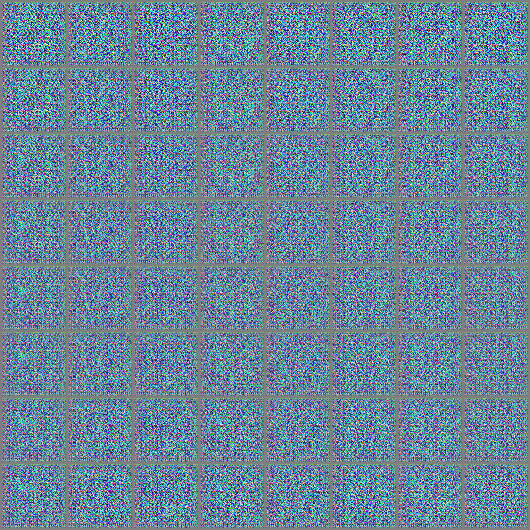

In [85]:
a=torch.FloatTensor(8,128,1,1).normal_(0,1).to(device)
b=torch.FloatTensor(8,128,1,1).normal_(0,1).to(device)
ab=(b-a)/8.
c=torch.FloatTensor(64,128,1,1).to(device)
for i in range(8):
   c[8*i:8*(i+1),:,:,:] = a + i*ab
c=Variable(c)
c_out= generator(c)

c_im = convert_img(c_out.data,8)
c_im


In [86]:
c=torch.FloatTensor(64,128,1,1).to(device)
c[9*1:9*(1+1)] = 1

In [87]:
torch.Tensor(10,128,1,1).shape

torch.Size([10, 128, 1, 1])

In [88]:


import numpy as np

from numpy import linspace
def interpolate(p1,p2,step=10):
  ratios=torch.linspace(0,2,steps=step)
  vec=torch.Tensor(10,128,1,1)
  i=0
  for ratio in ratios:
    #v = (1.0 - ratio) * p1 + ratio * p2
    m1=torch.mul(torch.sub(1.0,ratio), p1)
    m2=torch.mul(ratio,p2)
    add=torch.add(m1,m2)
    vec[i]=add.view(1,128,1,1)
    i=i+1
  return vec

In [89]:
ratios=torch.linspace(0,1,steps=10)
vec=torch.Tensor(10,128,1,1)
points =torch.randn(2,latent_size)
for ratio in ratios:
  m1=torch.mul(torch.sub(1.0,ratio), points[0])
  m2=torch.mul(ratio,points[1])
  add=torch.add(m1,m2)
  vec[0]=add.view(1,128,1,1)
  print(add.shape)
  break

torch.Size([128])


In [ ]:
vec=torch.Tensor(10,128,1,1)
vec[0]=1

In [96]:
latent_size=128
points =torch.randn(2,latent_size)
inter_polated = interpolate(points[0],points[1])


In [101]:
from IPython.display import Image

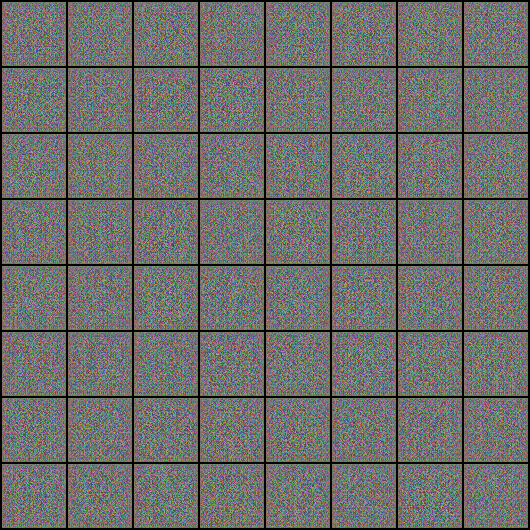

In [102]:
Image('/content/generated_65_resnet/img_generated-0092.png')

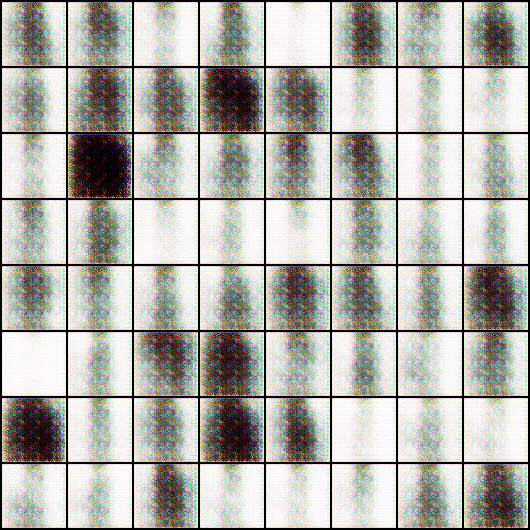

In [103]:
Image('/content/generated/img_generated-0079.png')

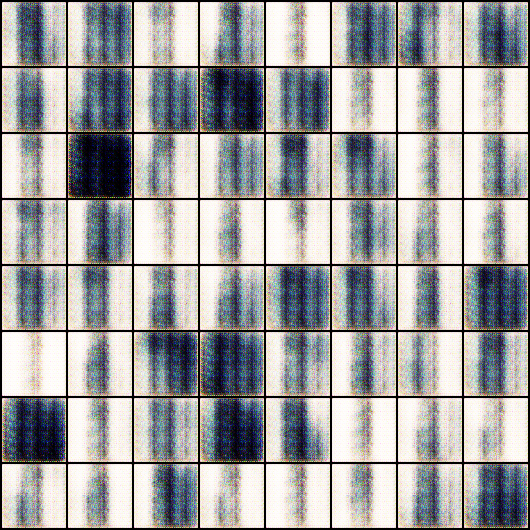

In [104]:
Image('/content/generated/img_generated-0085.png')

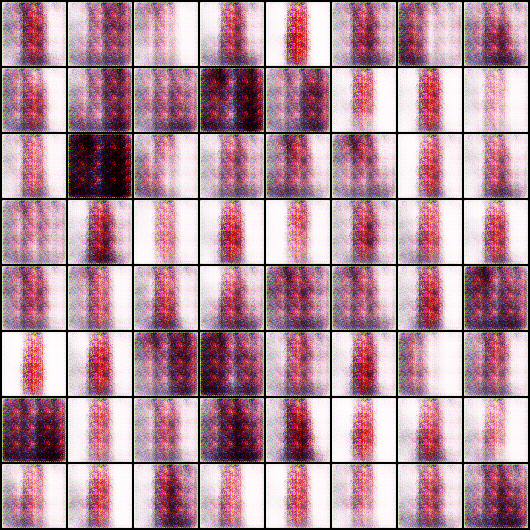

In [105]:
Image('/content/generated/img_generated-0092.png')

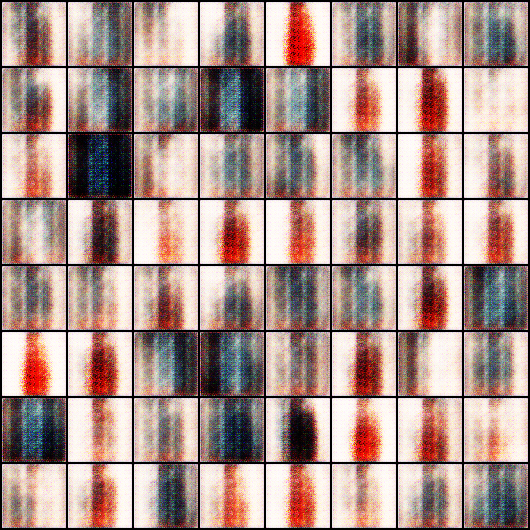

In [106]:
Image('/content/generated/img_generated-0100.png')